**Imports and Setup**

In [14]:
import os
import warnings
warnings.filterwarnings('ignore')

# Data handling
import pandas as pd
import numpy as np
from glob import glob

# Audio processing
import librosa
import librosa.display
import soundfile as sf
from scipy import signal, stats
from scipy.io import wavfile

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Audio, display
import plotly.express as px
import plotly.graph_objects as go

# Feature extraction
from scipy.stats import skew, kurtosis
from scipy.signal import welch

# Statistical analysis
from scipy.stats import shapiro, normaltest, anderson
from statsmodels.multivariate.manova import MANOVA
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

# Feature selection
from sklearn.feature_selection import (
    SelectKBest, f_classif, mutual_info_classif,
    RFE, SelectFromModel
)
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA

# Model building
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    classification_report, confusion_matrix, accuracy_score,
    precision_recall_fscore_support, roc_auc_score, roc_curve
)

# Deep learning
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, callbacks
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [15]:
# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

In [16]:
# Set plotting style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['font.size'] = 10

**DATA LOADING AND INITIAL EXPLORATION**

In [17]:
DATASET_PATH = r"C:\Users\hp\Desktop\Biomed\Respiratory_Sound_Database"
AUDIO_PATH = os.path.join(DATASET_PATH, "audio_and_txt_files")
METADATA_PATH = os.path.join(DATASET_PATH, "patient_diagnosis.csv")

In [18]:
print(f"Dataset path exists: {os.path.exists(DATASET_PATH)}")
print(f"Audio folder exists: {os.path.exists(AUDIO_PATH)}")
print(f"Metadata file exists: {os.path.exists(METADATA_PATH)}")


Dataset path exists: True
Audio folder exists: True
Metadata file exists: True


In [19]:
# Load patient diagnosis
diagnosis_df = pd.read_csv(METADATA_PATH, names=['Patient_ID', 'Diagnosis'])
print(f"\n✓ Loaded {len(diagnosis_df)} patient diagnoses")
print(f"Unique diagnoses: {diagnosis_df['Diagnosis'].unique()}")


✓ Loaded 126 patient diagnoses
Unique diagnoses: ['URTI' 'Healthy' 'Asthma' 'COPD' 'LRTI' 'Bronchiectasis' 'Pneumonia'
 'Bronchiolitis']


In [20]:
# Get all audio files
audio_files = sorted(glob(os.path.join(AUDIO_PATH, "*.wav")))
txt_files = sorted(glob(os.path.join(AUDIO_PATH, "*.txt")))
print(f"\n✓ Found {len(audio_files)} audio files")
print(f"✓ Found {len(txt_files)} annotation files")


✓ Found 920 audio files
✓ Found 920 annotation files


**PARSE FILE INFORMATION AND CREATE MASTER DATAFRAME**

In [21]:
def parse_filename(filename):
    """Extract information from audio filename"""
    basename = os.path.basename(filename).replace('.wav', '')
    parts = basename.split('_')
    
    return {
        'filename': basename,
        'patient_id': int(parts[0]),
        'recording_index': parts[1],
        'chest_location': parts[2],
        'acquisition_mode': parts[3],
        'equipment': parts[4] if len(parts) > 4 else 'Unknown'
    }


In [22]:
def load_annotations(txt_file):
    """Load annotation file with crackles and wheezes information"""
    try:
        annotations = pd.read_csv(txt_file, sep='\t', 
                                 names=['start', 'end', 'crackles', 'wheezes'])
        return annotations
    except:
        return None

In [23]:
# Create master dataframe
data_list = []

for audio_file in audio_files:
    # Parse filename
    file_info = parse_filename(audio_file)
    
    # Load corresponding annotation
    txt_file = audio_file.replace('.wav', '.txt')
    annotations = load_annotations(txt_file)
    
    if annotations is not None:
        # Determine class label based on annotations
        has_crackles = annotations['crackles'].sum() > 0
        has_wheezes = annotations['wheezes'].sum() > 0
        
        if has_crackles and has_wheezes:
            label = 'Both'
        elif has_crackles:
            label = 'Crackles'
        elif has_wheezes:
            label = 'Wheezes'
        else:
            label = 'Normal'
        
        # Add to list
        file_info.update({
            'audio_path': audio_file,
            'txt_path': txt_file,
            'label': label,
            'num_cycles': len(annotations),
            'total_crackles': annotations['crackles'].sum(),
            'total_wheezes': annotations['wheezes'].sum()
        })
        
        # Merge with diagnosis
        diagnosis = diagnosis_df[diagnosis_df['Patient_ID'] == file_info['patient_id']]['Diagnosis'].values
        file_info['diagnosis'] = diagnosis[0] if len(diagnosis) > 0 else 'Unknown'
        
        data_list.append(file_info)

In [24]:
# Create DataFrame
df = pd.DataFrame(data_list)

print(f"\n✓ Master dataframe created with {len(df)} recordings")
print(f"\nDataframe shape: {df.shape}")
print(f"\nColumns: {df.columns.tolist()}")
print(f"\n{df.head()}")


✓ Master dataframe created with 920 recordings

Dataframe shape: (920, 13)

Columns: ['filename', 'patient_id', 'recording_index', 'chest_location', 'acquisition_mode', 'equipment', 'audio_path', 'txt_path', 'label', 'num_cycles', 'total_crackles', 'total_wheezes', 'diagnosis']

                 filename  patient_id recording_index chest_location  \
0  101_1b1_Al_sc_Meditron         101             1b1             Al   
1  101_1b1_Pr_sc_Meditron         101             1b1             Pr   
2  102_1b1_Ar_sc_Meditron         102             1b1             Ar   
3  103_2b2_Ar_mc_LittC2SE         103             2b2             Ar   
4  104_1b1_Al_sc_Litt3200         104             1b1             Al   

  acquisition_mode equipment  \
0               sc  Meditron   
1               sc  Meditron   
2               sc  Meditron   
3               mc  LittC2SE   
4               sc  Litt3200   

                                          audio_path  \
0  C:\Users\hp\Desktop\Biomed\Respira

**EXPLORATORY DATA ANALYSIS (EDA)**


1. CLASS DISTRIBUTION:
label
Crackles    297
Normal      287
Both        202
Wheezes     134
Name: count, dtype: int64

Class percentages:
label
Crackles    32.282609
Normal      31.195652
Both        21.956522
Wheezes     14.565217
Name: proportion, dtype: float64


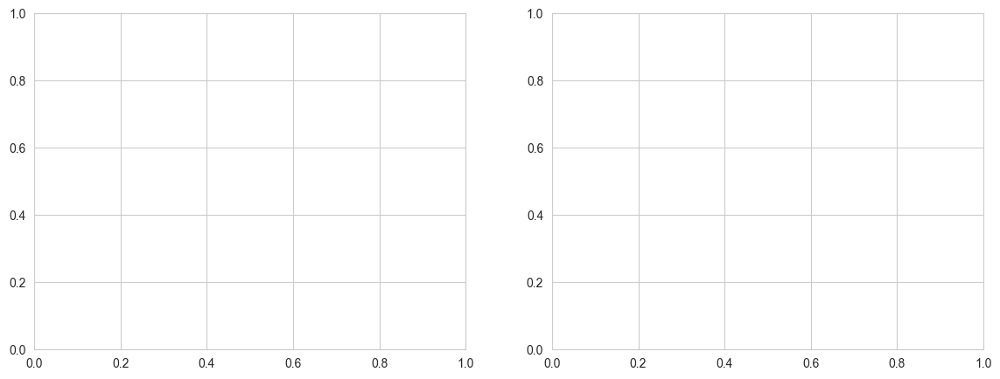

In [25]:
# Class distribution
print("\n1. CLASS DISTRIBUTION:")
print(df['label'].value_counts())
print(f"\nClass percentages:")
print(df['label'].value_counts(normalize=True) * 100)

# Plot class distribution
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

In [26]:
# Bar plot
df['label'].value_counts().plot(kind='bar', ax=axes[0], color='steelblue')
axes[0].set_title('Class Distribution (Count)', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Class', fontsize=12)
axes[0].set_ylabel('Count', fontsize=12)
axes[0].tick_params(axis='x', rotation=45)

In [27]:
# Pie chart
df['label'].value_counts().plot(kind='pie', ax=axes[1], autopct='%1.1f%%', 
                                colors=['#ff9999','#66b3ff','#99ff99','#ffcc99'])
axes[1].set_title('Class Distribution (Percentage)', fontsize=14, fontweight='bold')
axes[1].set_ylabel('')

plt.tight_layout()
plt.savefig('01_class_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

<Figure size 1200x600 with 0 Axes>


2. PATIENT-WISE DISTRIBUTION:
Total unique patients: 126
Recordings per patient: Min=1, Max=66, Mean=7.30

3. DIAGNOSIS DISTRIBUTION:
diagnosis
COPD              793
Pneumonia          37
Healthy            35
URTI               23
Bronchiectasis     16
Bronchiolitis      13
LRTI                2
Asthma              1
Name: count, dtype: int64


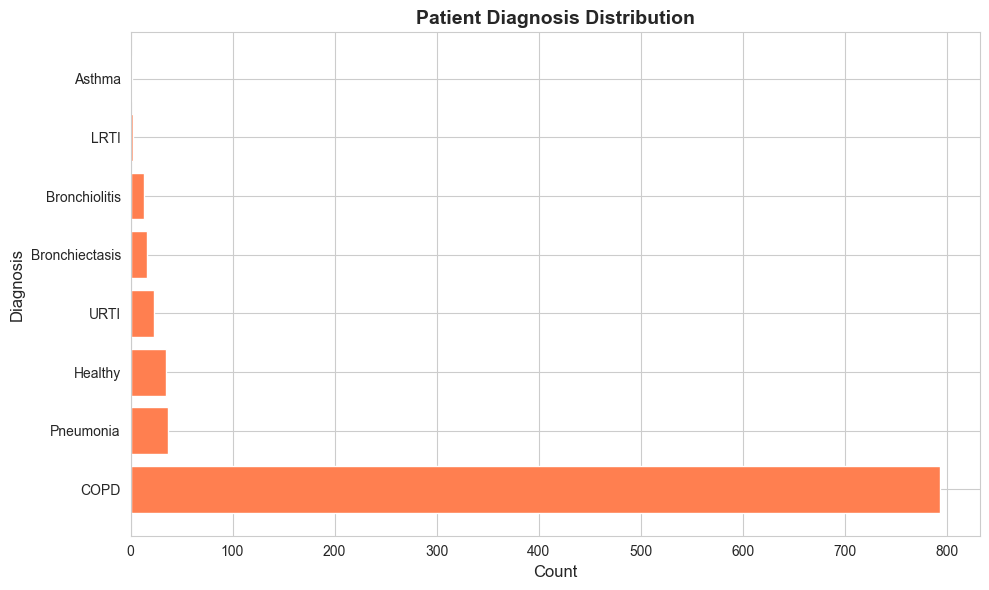

In [28]:
# Patient-wise distribution
print("\n2. PATIENT-WISE DISTRIBUTION:")
print(f"Total unique patients: {df['patient_id'].nunique()}")
print(f"Recordings per patient: Min={df.groupby('patient_id').size().min()}, "
      f"Max={df.groupby('patient_id').size().max()}, "
      f"Mean={df.groupby('patient_id').size().mean():.2f}")

# Diagnosis distribution
print("\n3. DIAGNOSIS DISTRIBUTION:")
print(df['diagnosis'].value_counts())

fig, ax = plt.subplots(figsize=(10, 6))
diagnosis_counts = df['diagnosis'].value_counts()
ax.barh(diagnosis_counts.index, diagnosis_counts.values, color='coral')
ax.set_title('Patient Diagnosis Distribution', fontsize=14, fontweight='bold')
ax.set_xlabel('Count', fontsize=12)
ax.set_ylabel('Diagnosis', fontsize=12)
plt.tight_layout()
plt.savefig('02_diagnosis_distribution.png', dpi=300, bbox_inches='tight')
plt.show()


4. CHEST LOCATION DISTRIBUTION:
chest_location
Ar    168
Al    162
Pl    139
Pr    132
Tc    130
Lr    112
Ll     77
Name: count, dtype: int64


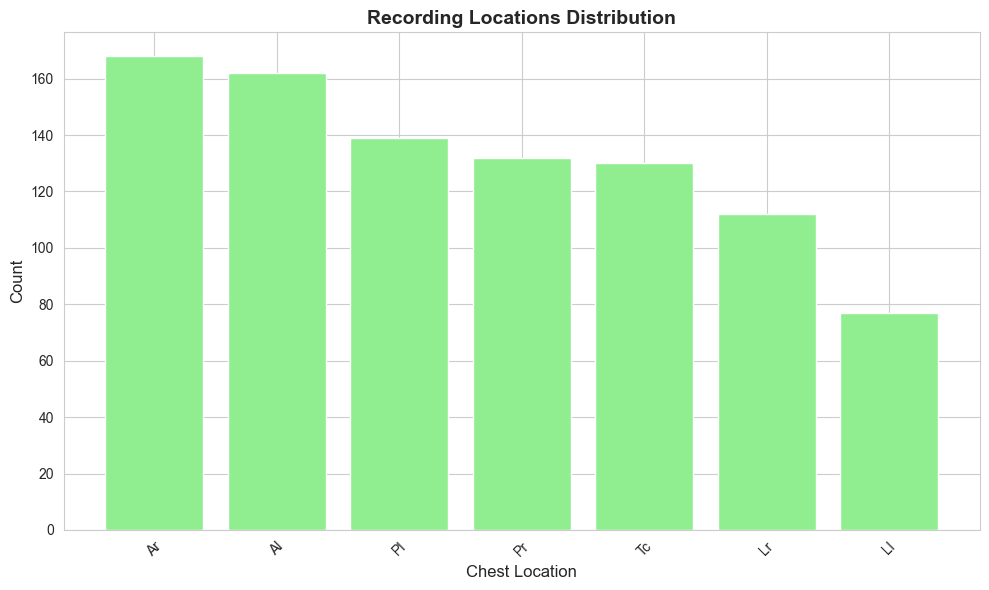

In [29]:
# Chest location distribution
print("\n4. CHEST LOCATION DISTRIBUTION:")
print(df['chest_location'].value_counts())

fig, ax = plt.subplots(figsize=(10, 6))
chest_loc = df['chest_location'].value_counts()
ax.bar(chest_loc.index, chest_loc.values, color='lightgreen')
ax.set_title('Recording Locations Distribution', fontsize=14, fontweight='bold')
ax.set_xlabel('Chest Location', fontsize=12)
ax.set_ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('03_chest_location_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

In [30]:
# Equipment distribution
print("\n5. RECORDING EQUIPMENT DISTRIBUTION:")
print(df['equipment'].value_counts())


5. RECORDING EQUIPMENT DISTRIBUTION:
equipment
AKGC417L    646
Meditron    127
LittC2SE     87
Litt3200     60
Name: count, dtype: int64


In [31]:
# Respiratory cycles statistics
print("\n6. RESPIRATORY CYCLES STATISTICS:")
print(df[['num_cycles', 'total_crackles', 'total_wheezes']].describe())


6. RESPIRATORY CYCLES STATISTICS:
       num_cycles  total_crackles  total_wheezes
count  920.000000      920.000000     920.000000
mean     7.497826        2.576087       1.513043
std      3.335762        3.130578       2.572949
min      2.000000        0.000000       0.000000
25%      5.000000        0.000000       0.000000
50%      7.000000        1.000000       0.000000
75%      9.000000        5.000000       2.000000
max     33.000000       16.000000      14.000000


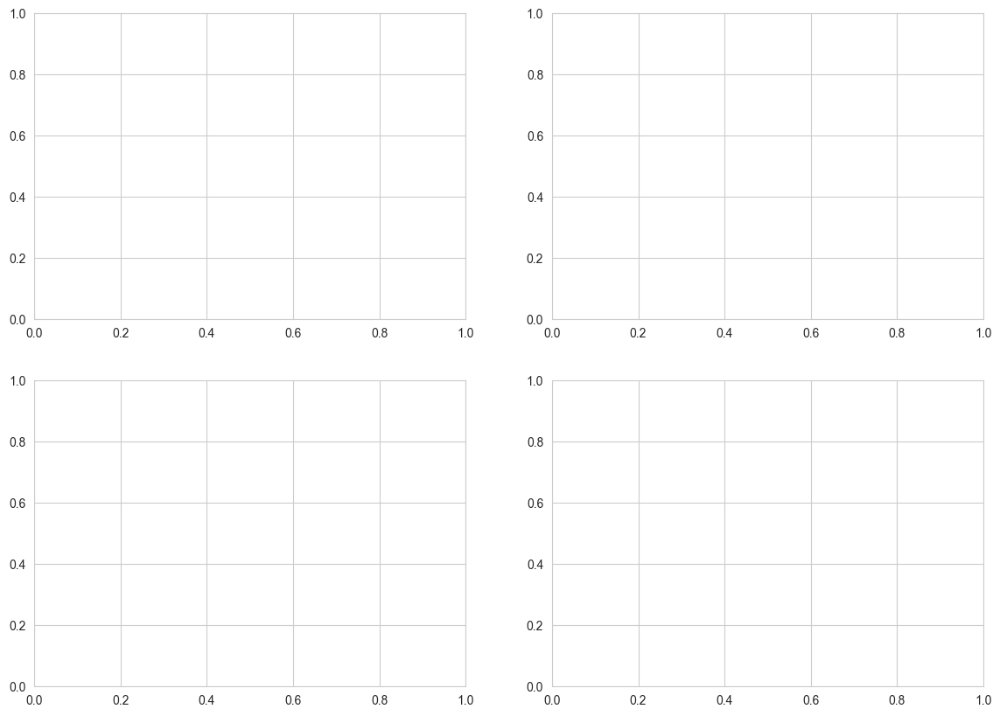

In [32]:
# Visualize respiratory cycles
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

In [33]:
# Histogram of cycles
axes[0, 0].hist(df['num_cycles'], bins=30, color='skyblue', edgecolor='black')
axes[0, 0].set_title('Distribution of Respiratory Cycles per Recording', fontweight='bold')
axes[0, 0].set_xlabel('Number of Cycles')
axes[0, 0].set_ylabel('Frequency')

# Boxplot of cycles by class
df.boxplot(column='num_cycles', by='label', ax=axes[0, 1])
axes[0, 1].set_title('Respiratory Cycles by Class', fontweight='bold')
axes[0, 1].set_xlabel('Class')
axes[0, 1].set_ylabel('Number of Cycles')

# Crackles distribution
axes[1, 0].hist(df['total_crackles'], bins=30, color='salmon', edgecolor='black')
axes[1, 0].set_title('Distribution of Crackles per Recording', fontweight='bold')
axes[1, 0].set_xlabel('Number of Crackles')
axes[1, 0].set_ylabel('Frequency')

# Wheezes distribution
axes[1, 1].hist(df['total_wheezes'], bins=30, color='lightgreen', edgecolor='black')
axes[1, 1].set_title('Distribution of Wheezes per Recording', fontweight='bold')
axes[1, 1].set_xlabel('Number of Wheezes')
axes[1, 1].set_ylabel('Frequency')

plt.suptitle('')
plt.tight_layout()
plt.savefig('04_respiratory_cycles_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

<Figure size 1200x600 with 0 Axes>


7. CLASS vs DIAGNOSIS CROSSTAB:
diagnosis  Asthma  Bronchiectasis  Bronchiolitis  COPD  Healthy  LRTI  \
label                                                                   
Both            0               4              4   188        2     0   
Crackles        0               2              3   277        4     0   
Normal          0               6              1   215       28     1   
Wheezes         1               4              5   113        1     1   

diagnosis  Pneumonia  URTI  
label                       
Both               0     4  
Crackles           7     4  
Normal            22    14  
Wheezes            8     1  


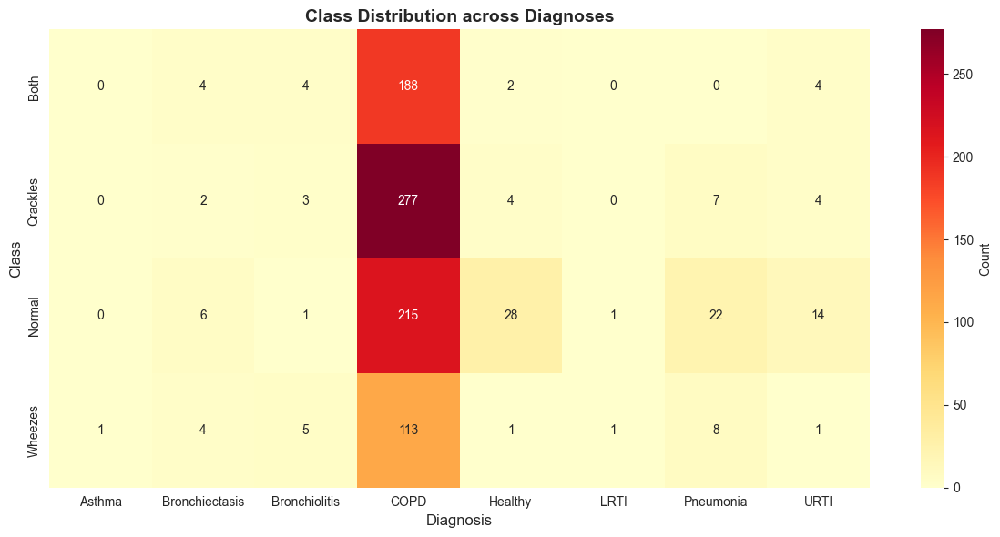

In [34]:
# Cross-tabulation analysis
print("\n7. CLASS vs DIAGNOSIS CROSSTAB:")
crosstab = pd.crosstab(df['label'], df['diagnosis'])
print(crosstab)

# Visualize crosstab
plt.figure(figsize=(12, 6))
sns.heatmap(crosstab, annot=True, fmt='d', cmap='YlOrRd', cbar_kws={'label': 'Count'})
plt.title('Class Distribution across Diagnoses', fontsize=14, fontweight='bold')
plt.xlabel('Diagnosis', fontsize=12)
plt.ylabel('Class', fontsize=12)
plt.tight_layout()
plt.savefig('05_class_diagnosis_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

**AUDIO VISUALIZATION AND EXPLORATION**

In [36]:
def visualize_audio(audio_path, txt_path, title="Audio Visualization"):
    """Comprehensive audio visualization"""
    # Load audio
    y, sr = librosa.load(audio_path, sr=None)
    duration = librosa.get_duration(y=y, sr=sr)
    
    # Load annotations
    annotations = load_annotations(txt_path)
    
    # Create subplots
    fig = plt.figure(figsize=(16, 12))
    gs = fig.add_gridspec(4, 2, hspace=0.4, wspace=0.3)
    
    # 1. Waveform
    ax1 = fig.add_subplot(gs[0, :])
    librosa.display.waveshow(y, sr=sr, ax=ax1, color='steelblue')
    ax1.set_title(f'{title} - Waveform', fontweight='bold', fontsize=12)
    ax1.set_xlabel('Time (s)')
    ax1.set_ylabel('Amplitude')
    
    # Mark respiratory cycles
    if annotations is not None:
        for idx, row in annotations.iterrows():
            if row['crackles'] == 1:
                ax1.axvspan(row['start'], row['end'], alpha=0.3, color='red', label='Crackles' if idx == 0 else '')
            if row['wheezes'] == 1:
                ax1.axvspan(row['start'], row['end'], alpha=0.3, color='yellow', label='Wheezes' if idx == 0 else '')
    
    # 2. Spectrogram
    ax2 = fig.add_subplot(gs[1, :])
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    img = librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='hz', ax=ax2, cmap='viridis')
    ax2.set_title('Spectrogram', fontweight='bold', fontsize=12)
    ax2.set_ylabel('Frequency (Hz)')
    fig.colorbar(img, ax=ax2, format='%+2.0f dB')
    
    # 3. Mel Spectrogram
    ax3 = fig.add_subplot(gs[2, :])
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)
    S_db = librosa.power_to_db(S, ref=np.max)
    img = librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='mel', ax=ax3, cmap='magma')
    ax3.set_title('Mel Spectrogram', fontweight='bold', fontsize=12)
    ax3.set_ylabel('Mel Frequency')
    fig.colorbar(img, ax=ax3, format='%+2.0f dB')
    
    # 4. Zero Crossing Rate
    ax4 = fig.add_subplot(gs[3, 0])
    zcr = librosa.feature.zero_crossing_rate(y)[0]
    frames = range(len(zcr))
    t = librosa.frames_to_time(frames, sr=sr)
    ax4.plot(t, zcr, color='green')
    ax4.set_title('Zero Crossing Rate', fontweight='bold', fontsize=12)
    ax4.set_xlabel('Time (s)')
    ax4.set_ylabel('ZCR')
    
    # 5. Spectral Centroid
    ax5 = fig.add_subplot(gs[3, 1])
    spectral_centroids = librosa.feature.spectral_centroid(y=y, sr=sr)[0]
    frames = range(len(spectral_centroids))
    t = librosa.frames_to_time(frames, sr=sr)
    ax5.plot(t, spectral_centroids, color='orange')
    ax5.set_title('Spectral Centroid', fontweight='bold', fontsize=12)
    ax5.set_xlabel('Time (s)')
    ax5.set_ylabel('Hz')
    
    plt.suptitle(f'Audio Analysis: {os.path.basename(audio_path)}', 
                 fontsize=14, fontweight='bold', y=0.995)
    
    return fig, y, sr


Visualizing sample recordings from each class...

Class: Normal | File: 101_1b1_Al_sc_Meditron
Patient ID: 101 | Diagnosis: URTI
Cycles: 12 | Crackles: 0 | Wheezes: 0


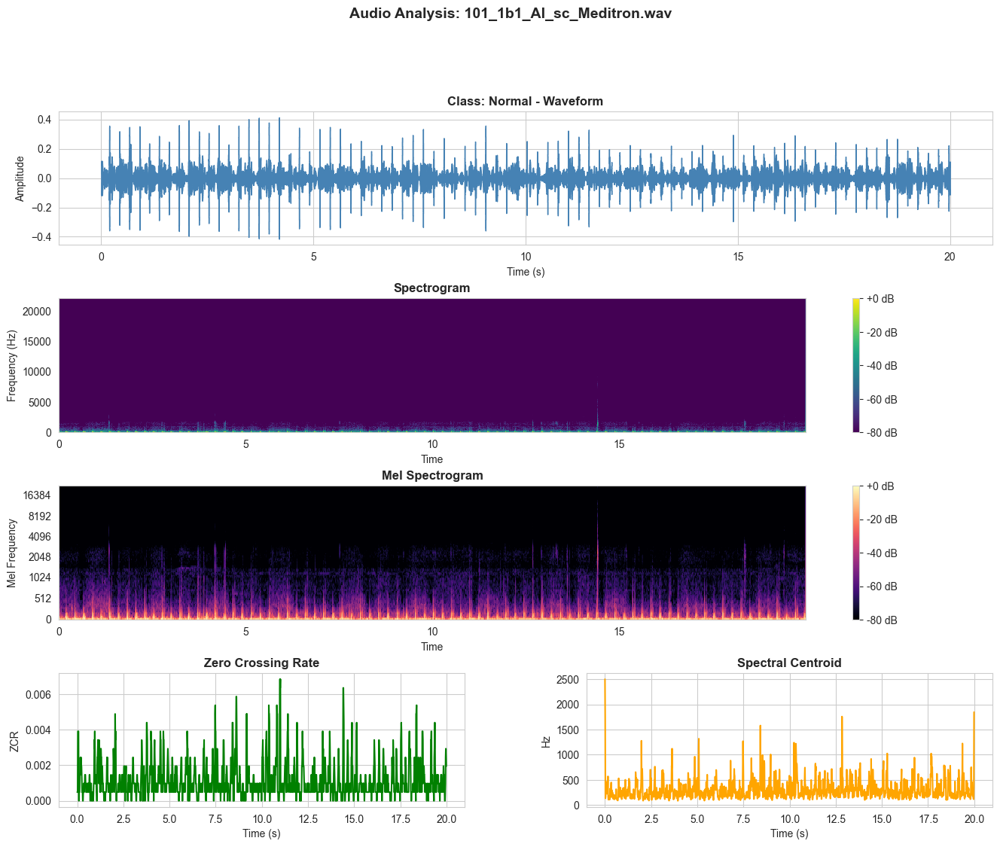

Audio playback:



Class: Wheezes | File: 103_2b2_Ar_mc_LittC2SE
Patient ID: 103 | Diagnosis: Asthma
Cycles: 6 | Crackles: 0 | Wheezes: 4


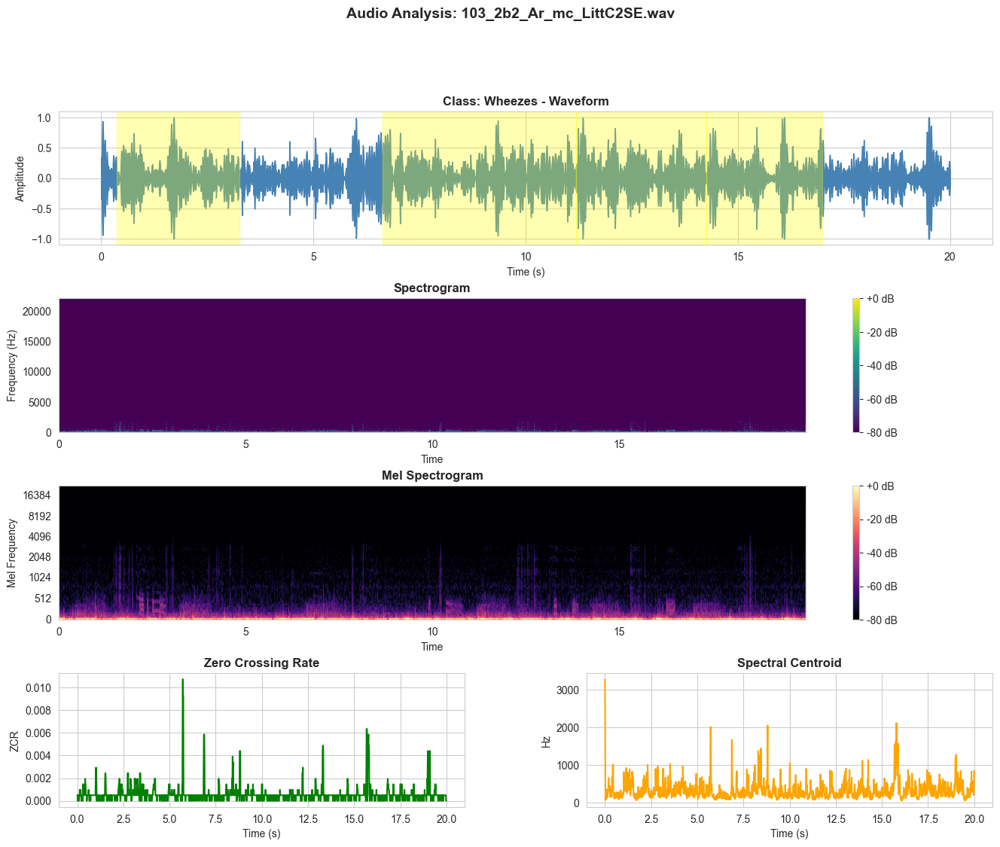

Audio playback:



Class: Crackles | File: 104_1b1_Ll_sc_Litt3200
Patient ID: 104 | Diagnosis: COPD
Cycles: 7 | Crackles: 1 | Wheezes: 0


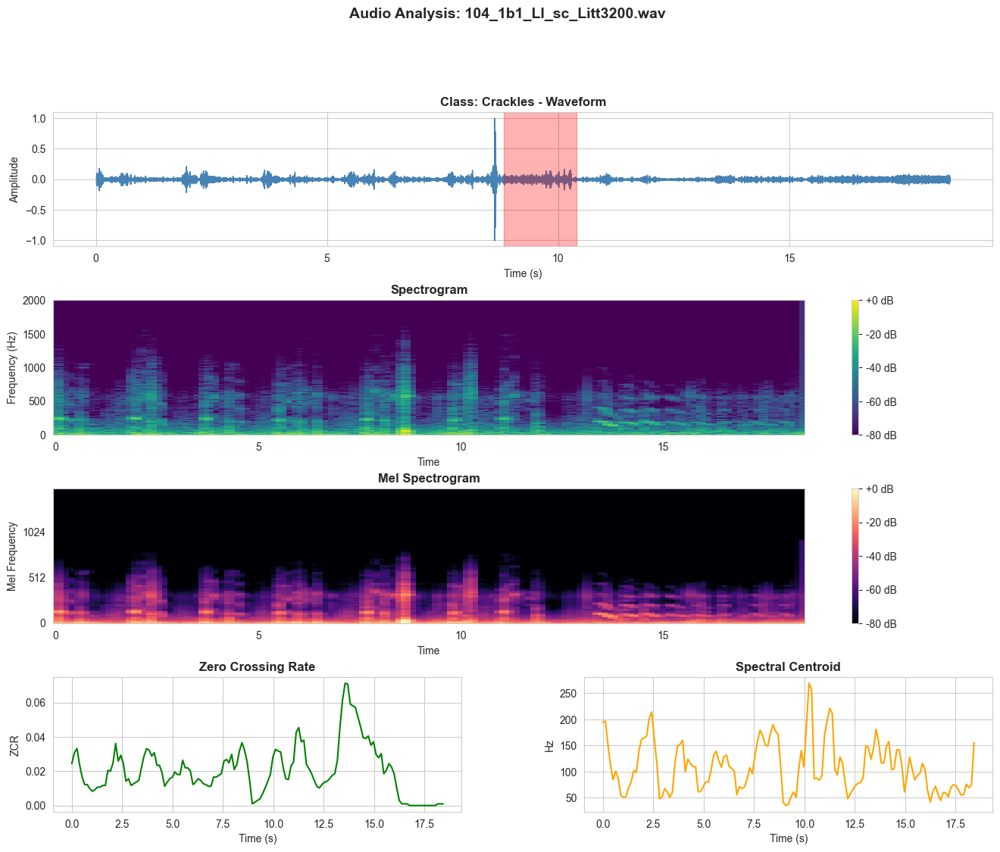

Audio playback:



Class: Both | File: 107_2b3_Ar_mc_AKGC417L
Patient ID: 107 | Diagnosis: COPD
Cycles: 8 | Crackles: 8 | Wheezes: 7


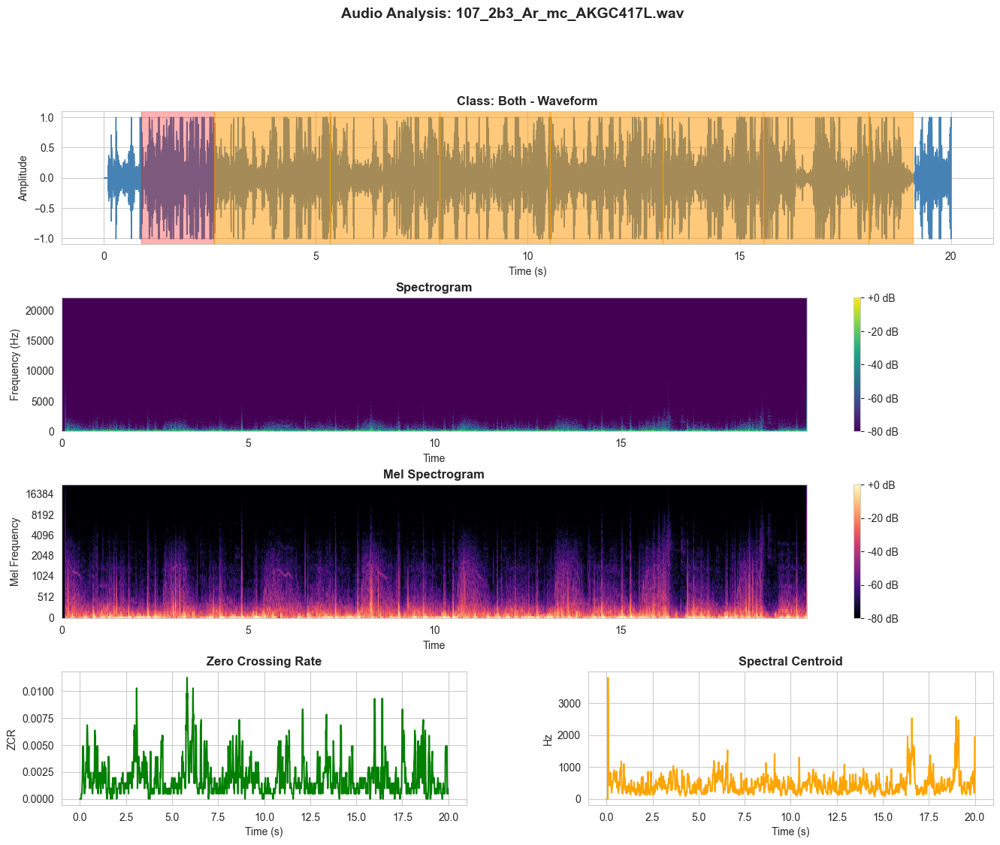

Audio playback:


In [40]:
# Visualize sample from each class
print("\nVisualizing sample recordings from each class...")

for class_label in df['label'].unique():
    sample = df[df['label'] == class_label].iloc[0]
    print(f"\nClass: {class_label} | File: {sample['filename']}")
    print(f"Patient ID: {sample['patient_id']} | Diagnosis: {sample['diagnosis']}")
    print(f"Cycles: {sample['num_cycles']} | Crackles: {sample['total_crackles']} | Wheezes: {sample['total_wheezes']}")
    
    fig, y, sr = visualize_audio(sample['audio_path'], sample['txt_path'], 
                                 title=f"Class: {class_label}")
    plt.savefig(f'06_audio_visualization_{class_label}.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Display audio player
    print("Audio playback:")
    display(Audio(y, rate=sr))

**FEATURE EXTRACTION (TIME & FREQUENCY DOMAIN)**

In [41]:
def extract_features(audio_path, sr=22050):
    """
    Extract comprehensive time and frequency domain features
    
    Features include:
    - Time domain: ZCR, Energy, Entropy
    - Frequency domain: Spectral features, MFCCs
    - Statistical: Mean, Std, Skewness, Kurtosis
    """
    try:
        # Load audio
        y, sr = librosa.load(audio_path, sr=sr)
        
        # Trim silence
        y, _ = librosa.effects.trim(y, top_db=20)
        
        features = {}
        
        # ==========================
        # TIME DOMAIN FEATURES
        # ==========================
        
        # 1. Zero Crossing Rate
        zcr = librosa.feature.zero_crossing_rate(y)[0]
        features['zcr_mean'] = np.mean(zcr)
        features['zcr_std'] = np.std(zcr)
        features['zcr_skew'] = skew(zcr)
        features['zcr_kurtosis'] = kurtosis(zcr)
        
        # 2. Energy
        energy = np.sum(y**2) / len(y)
        features['energy'] = energy
        
        # 3. RMS Energy
        rms = librosa.feature.rms(y=y)[0]
        features['rms_mean'] = np.mean(rms)
        features['rms_std'] = np.std(rms)
        
        # 4. Amplitude statistics
        features['amplitude_mean'] = np.mean(np.abs(y))
        features['amplitude_std'] = np.std(y)
        features['amplitude_max'] = np.max(np.abs(y))
        features['amplitude_min'] = np.min(np.abs(y))
        
        # ==========================
        # FREQUENCY DOMAIN FEATURES
        # ==========================
        
        # 5. Spectral Centroid
        spectral_centroids = librosa.feature.spectral_centroid(y=y, sr=sr)[0]
        features['spectral_centroid_mean'] = np.mean(spectral_centroids)
        features['spectral_centroid_std'] = np.std(spectral_centroids)
        features['spectral_centroid_skew'] = skew(spectral_centroids)
        features['spectral_centroid_kurtosis'] = kurtosis(spectral_centroids)
        
        # 6. Spectral Rolloff
        spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)[0]
        features['spectral_rolloff_mean'] = np.mean(spectral_rolloff)
        features['spectral_rolloff_std'] = np.std(spectral_rolloff)
        
        # 7. Spectral Bandwidth
        spectral_bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr)[0]
        features['spectral_bandwidth_mean'] = np.mean(spectral_bandwidth)
        features['spectral_bandwidth_std'] = np.std(spectral_bandwidth)
        
        # 8. Spectral Contrast
        spectral_contrast = librosa.feature.spectral_contrast(y=y, sr=sr)
        for i in range(spectral_contrast.shape[0]):
            features[f'spectral_contrast_{i}_mean'] = np.mean(spectral_contrast[i])
        
        # 9. Spectral Flatness
        spectral_flatness = librosa.feature.spectral_flatness(y=y)[0]
        features['spectral_flatness_mean'] = np.mean(spectral_flatness)
        features['spectral_flatness_std'] = np.std(spectral_flatness)
        
        # 10. MFCCs (Mel-Frequency Cepstral Coefficients)
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=20)
        for i in range(mfccs.shape[0]):
            features[f'mfcc_{i}_mean'] = np.mean(mfccs[i])
            features[f'mfcc_{i}_std'] = np.std(mfccs[i])
            features[f'mfcc_{i}_skew'] = skew(mfccs[i])
            features[f'mfcc_{i}_kurtosis'] = kurtosis(mfccs[i])
        
        # 11. Chroma Features
        chroma = librosa.feature.chroma_stft(y=y, sr=sr)
        features['chroma_mean'] = np.mean(chroma)
        features['chroma_std'] = np.std(chroma)
        
        # 12. Tonnetz (Tonal Centroid Features)
        tonnetz = librosa.feature.tonnetz(y=y, sr=sr)
        features['tonnetz_mean'] = np.mean(tonnetz)
        features['tonnetz_std'] = np.std(tonnetz)
        
        # ==========================
        # ADDITIONAL FEATURES
        # ==========================
        
        # 13. Tempo
        tempo, _ = librosa.beat.beat_track(y=y, sr=sr)
        features['tempo'] = tempo
        
        # 14. Harmonic and Percussive components
        y_harmonic, y_percussive = librosa.effects.hpss(y)
        features['harmonic_mean'] = np.mean(np.abs(y_harmonic))
        features['percussive_mean'] = np.mean(np.abs(y_percussive))
        
        # 15. Duration
        features['duration'] = librosa.get_duration(y=y, sr=sr)
        
        return features
    
    except Exception as e:
        print(f"Error extracting features from {audio_path}: {str(e)}")
        return None

In [42]:
# Extract features for all audio files
feature_list = []

for idx, row in df.iterrows():
    if idx % 100 == 0:
        print(f"Processing file {idx+1}/{len(df)}")
    
    features = extract_features(row['audio_path'])
    
    if features is not None:
        features['filename'] = row['filename']
        features['patient_id'] = row['patient_id']
        features['label'] = row['label']
        features['diagnosis'] = row['diagnosis']
        features['chest_location'] = row['chest_location']
        feature_list.append(features)


Processing file 1/920
Processing file 101/920
Processing file 201/920
Processing file 301/920
Processing file 401/920
Processing file 501/920
Processing file 601/920
Processing file 701/920
Processing file 801/920
Processing file 901/920


In [43]:
# Create features dataframe
features_df = pd.DataFrame(feature_list)

print(f"\n✓ Feature extraction completed!")
print(f"Features shape: {features_df.shape}")
print(f"Total features extracted: {features_df.shape[1] - 5}")


✓ Feature extraction completed!
Features shape: (920, 121)
Total features extracted: 116


In [44]:
# Save features
features_df.to_csv('extracted_features.csv', index=False)
print("Features saved to 'extracted_features.csv'")

Features saved to 'extracted_features.csv'


In [45]:
# Display sample features
print("\nSample features:")
print(features_df.head())


Sample features:
   zcr_mean   zcr_std  zcr_skew  zcr_kurtosis    energy  rms_mean   rms_std  \
0  0.002117  0.001220  0.936800      0.488458  0.003646  0.056384  0.021407   
1  0.001885  0.001230  2.490310     10.930002  0.001345  0.034013  0.013639   
2  0.002278  0.001843  1.685531      3.425401  0.000569  0.022135  0.008844   
3  0.001110  0.000836  3.652566     18.340449  0.078692  0.251625  0.123451   
4  0.006775  0.006015  1.401172      1.170270  0.007565  0.069497  0.052177   

   amplitude_mean  amplitude_std  amplitude_max  ...  tonnetz_std  \
0        0.044561       0.060382       0.414731  ...     0.036406   
1        0.028555       0.036674       0.159667  ...     0.059532   
2        0.018581       0.023849       0.129059  ...     0.043244   
3        0.218909       0.280521       1.000357  ...     0.053825   
4        0.055478       0.086781       1.000928  ...     0.058722   

                 tempo  harmonic_mean  percussive_mean   duration  \
0          [57.421875] 

In [46]:
# Feature statistics
print("\nFeature statistics:")
numeric_features = features_df.select_dtypes(include=[np.number])
print(numeric_features.describe())


Feature statistics:
         zcr_mean     zcr_std    zcr_skew  zcr_kurtosis      energy  \
count  920.000000  920.000000  920.000000    920.000000  920.000000   
mean     0.007501    0.006326    5.588229     67.655230    0.050170   
std      0.009261    0.005554    4.744943     79.916902    0.069051   
min      0.000745    0.000432   -0.522657     -1.103520    0.000006   
25%      0.003642    0.003310    1.603913      3.373712    0.005550   
50%      0.005586    0.005714    3.414111     20.006991    0.020879   
75%      0.008201    0.007099    9.702406    130.056203    0.067593   
max      0.127379    0.060241   16.455076    272.903699    0.640630   

         rms_mean     rms_std  amplitude_mean  amplitude_std  amplitude_max  \
count  920.000000  920.000000      920.000000     920.000000     920.000000   
mean     0.162461    0.073414        0.134119       0.179454       0.779154   
std      0.124624    0.053029        0.105387       0.133342       0.322924   
min      0.002348    0.

**NORMALIZATION TESTING & DISTRIBUTION ANALYSIS**

In [47]:
# Prepare feature matrix (exclude metadata columns)
X_raw = features_df.drop(['filename', 'patient_id', 'label', 'diagnosis', 'chest_location'], 
                         axis=1, errors='ignore')
y = features_df['label']

In [48]:
print(f"\nFeature matrix shape: {X_raw.shape}")
print(f"Number of features: {X_raw.shape[1]}")
print(f"Number of samples: {X_raw.shape[0]}")


Feature matrix shape: (920, 116)
Number of features: 116
Number of samples: 920


In [49]:
# Check for missing values
print(f"\nMissing values: {X_raw.isnull().sum().sum()}")
if X_raw.isnull().sum().sum() > 0:
    print("Filling missing values with median...")
    X_raw = X_raw.fillna(X_raw.median())



Missing values: 0


In [51]:
numeric_df = X_raw.select_dtypes(include=[np.number])
print("Infinite values:", np.isinf(numeric_df).sum().sum())

if np.isinf(numeric_df).sum().sum() > 0:
    print("Replacing infinite values...")
    X_raw = X_raw.replace([np.inf, -np.inf], np.nan)
    X_raw = X_raw.fillna(X_raw.median(numeric_only=True))


Infinite values: 0


1. SHAPIRO-WILK TEST (Normality Test)

In [52]:
shapiro_results = []

# Test subset of features (testing all would be too many)
sample_features = X_raw.columns[:20]  # Test first 20 features

for feature in sample_features:
    stat, p_value = shapiro(X_raw[feature])
    is_normal = p_value > 0.05
    shapiro_results.append({
        'Feature': feature,
        'Statistic': stat,
        'P-value': p_value,
        'Normal': is_normal
    })

shapiro_df = pd.DataFrame(shapiro_results)
print(shapiro_df.to_string(index=False))

normal_count = shapiro_df['Normal'].sum()
print(f"\n{normal_count}/{len(sample_features)} features follow normal distribution (α=0.05)")


                   Feature  Statistic      P-value  Normal
                  zcr_mean   0.476491 1.316842e-45   False
                   zcr_std   0.648807 9.640593e-40   False
                  zcr_skew   0.863072 1.445166e-27   False
              zcr_kurtosis   0.797979 2.599268e-32   False
                    energy   0.710303 4.593264e-37   False
                  rms_mean   0.916521 4.205732e-22   False
                   rms_std   0.934781 1.287284e-19   False
            amplitude_mean   0.906892 2.976496e-23   False
             amplitude_std   0.926268 7.836722e-21   False
             amplitude_max   0.783396 3.330395e-33   False
             amplitude_min   0.360001 1.021976e-48   False
    spectral_centroid_mean   0.846578 6.506256e-29   False
     spectral_centroid_std   0.844684 4.634525e-29   False
    spectral_centroid_skew   0.724965 2.333260e-36   False
spectral_centroid_kurtosis   0.471646 9.534012e-46   False
     spectral_rolloff_mean   0.628428 1.516825e-40   Fal

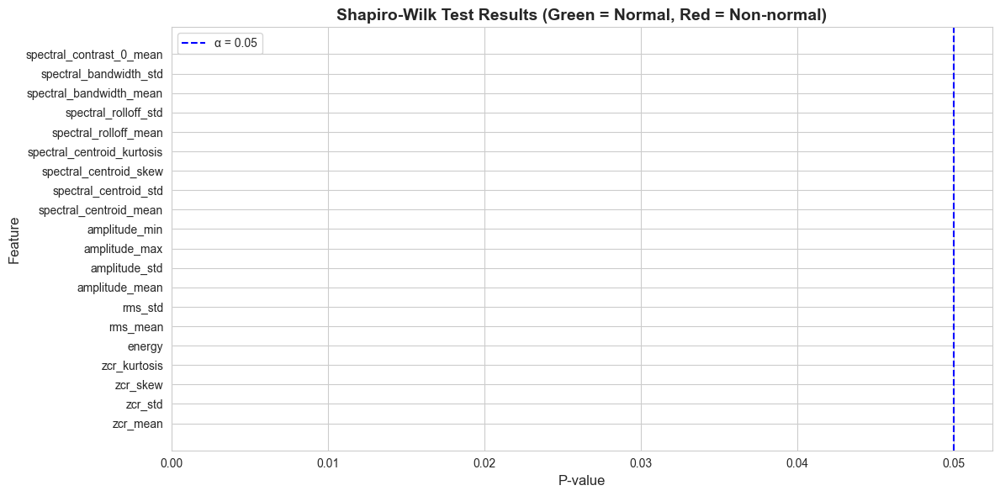

In [53]:
# Visualize normality test results
fig, ax = plt.subplots(figsize=(12, 6))
colors = ['green' if x else 'red' for x in shapiro_df['Normal']]
ax.barh(shapiro_df['Feature'], shapiro_df['P-value'], color=colors)
ax.axvline(x=0.05, color='blue', linestyle='--', label='α = 0.05')
ax.set_xlabel('P-value', fontsize=12)
ax.set_ylabel('Feature', fontsize=12)
ax.set_title('Shapiro-Wilk Test Results (Green = Normal, Red = Non-normal)', 
             fontsize=14, fontweight='bold')
ax.legend()
plt.tight_layout()
plt.savefig('07_shapiro_wilk_test.png', dpi=300, bbox_inches='tight')
plt.show()

2. DISTRIBUTION VISUALIZATION

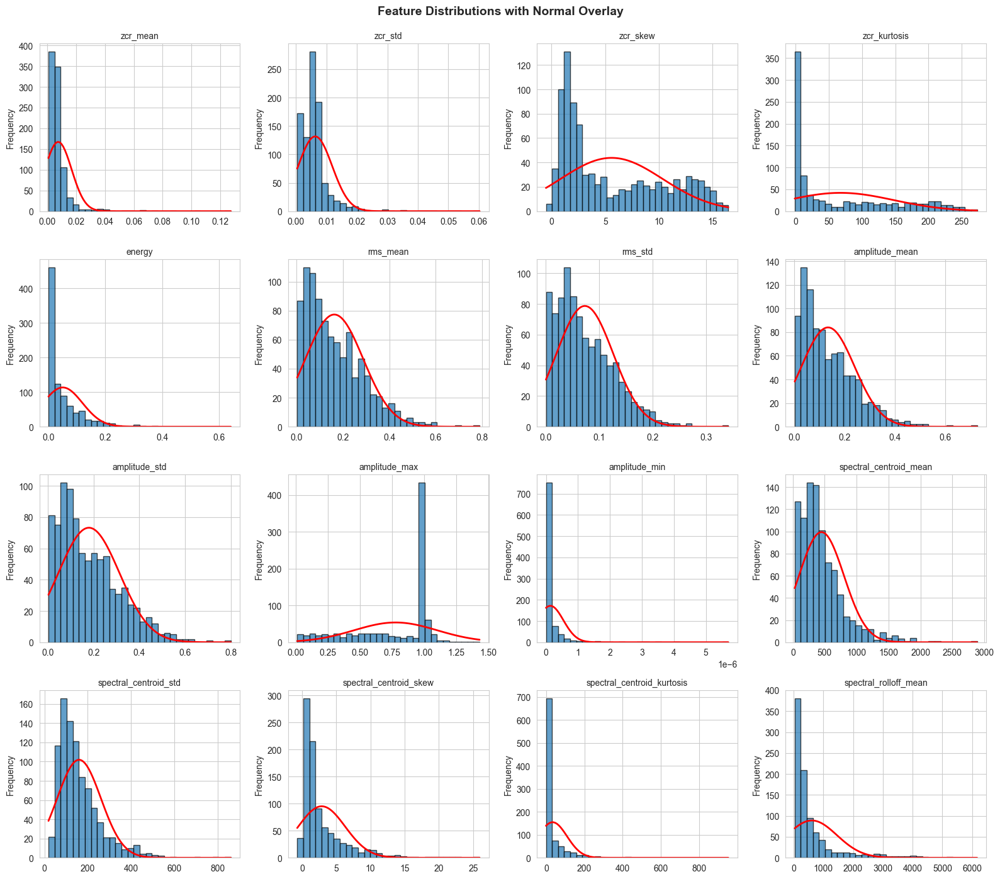

In [55]:
# Visualize distributions of selected features
fig, axes = plt.subplots(4, 4, figsize=(16, 14))
axes = axes.ravel()

for idx, feature in enumerate(sample_features[:16]):
    axes[idx].hist(X_raw[feature], bins=30, edgecolor='black', alpha=0.7)
    axes[idx].set_title(feature, fontsize=10)
    axes[idx].set_ylabel('Frequency')
    
    # Add normal distribution overlay
    mu, std = X_raw[feature].mean(), X_raw[feature].std()
    x = np.linspace(X_raw[feature].min(), X_raw[feature].max(), 100)
    axes[idx].plot(x, stats.norm.pdf(x, mu, std) * len(X_raw[feature]) * 
                   (X_raw[feature].max() - X_raw[feature].min()) / 30, 
                   'r-', linewidth=2, label='Normal')

plt.suptitle('Feature Distributions with Normal Overlay', 
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('08_feature_distributions.png', dpi=300, bbox_inches='tight')
plt.show()

3. Q-Q PLOTS (Quantile-Quantile plots)

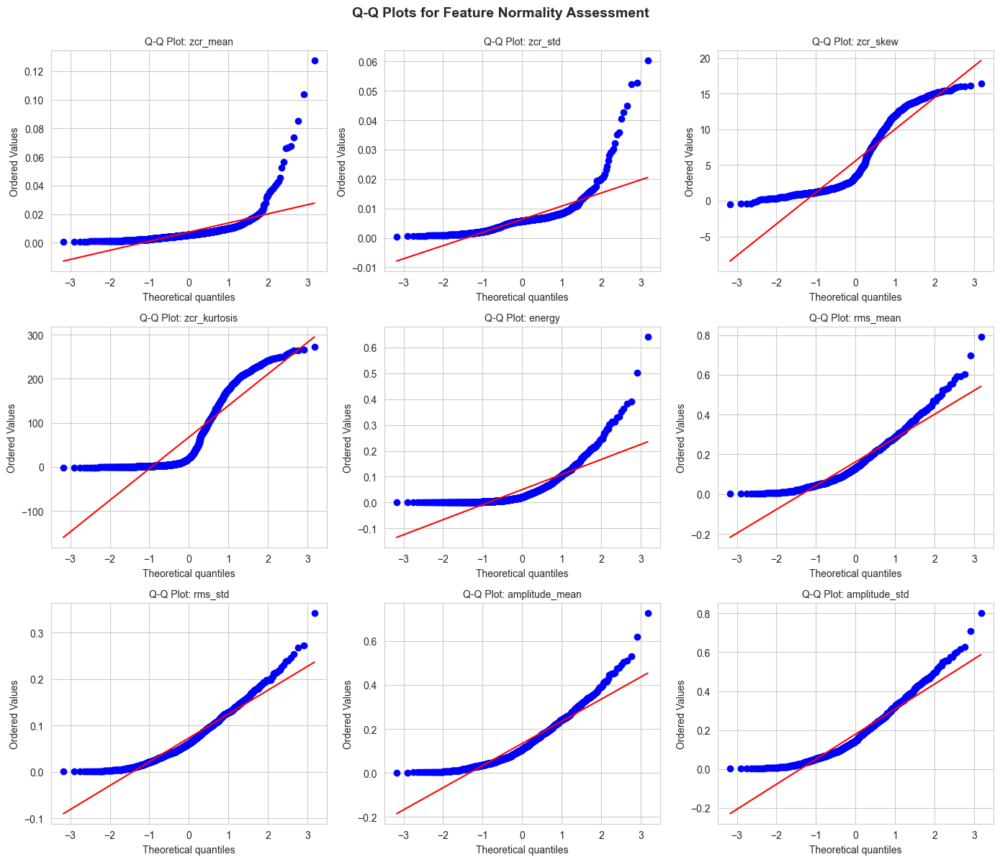

In [56]:
fig, axes = plt.subplots(3, 3, figsize=(14, 12))
axes = axes.ravel()

for idx, feature in enumerate(sample_features[:9]):
    stats.probplot(X_raw[feature], dist="norm", plot=axes[idx])
    axes[idx].set_title(f'Q-Q Plot: {feature}', fontsize=10)

plt.suptitle('Q-Q Plots for Feature Normality Assessment', 
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('09_qq_plots.png', dpi=300, bbox_inches='tight')
plt.show()

**PREPROCESSING & SCALING**

In [57]:
# Compare different scalers
scalers = {
    'StandardScaler': StandardScaler(),
    'MinMaxScaler': MinMaxScaler(),
    'RobustScaler': RobustScaler()
}

In [58]:
scaled_data = {}

for scaler_name, scaler in scalers.items():
    X_scaled = scaler.fit_transform(X_raw)
    scaled_data[scaler_name] = X_scaled
    print(f"\n{scaler_name}:")
    print(f"  Mean: {X_scaled.mean():.6f}")
    print(f"  Std: {X_scaled.std():.6f}")
    print(f"  Min: {X_scaled.min():.6f}")
    print(f"  Max: {X_scaled.max():.6f}")


StandardScaler:
  Mean: -0.000000
  Std: 1.000000
  Min: -8.971452
  Max: 23.335757

MinMaxScaler:
  Mean: 0.326331
  Std: 0.245205
  Min: 0.000000
  Max: 1.000000

RobustScaler:
  Mean: 0.412448
  Std: 14.672426
  Min: -328.731544
  Max: 1225.447987


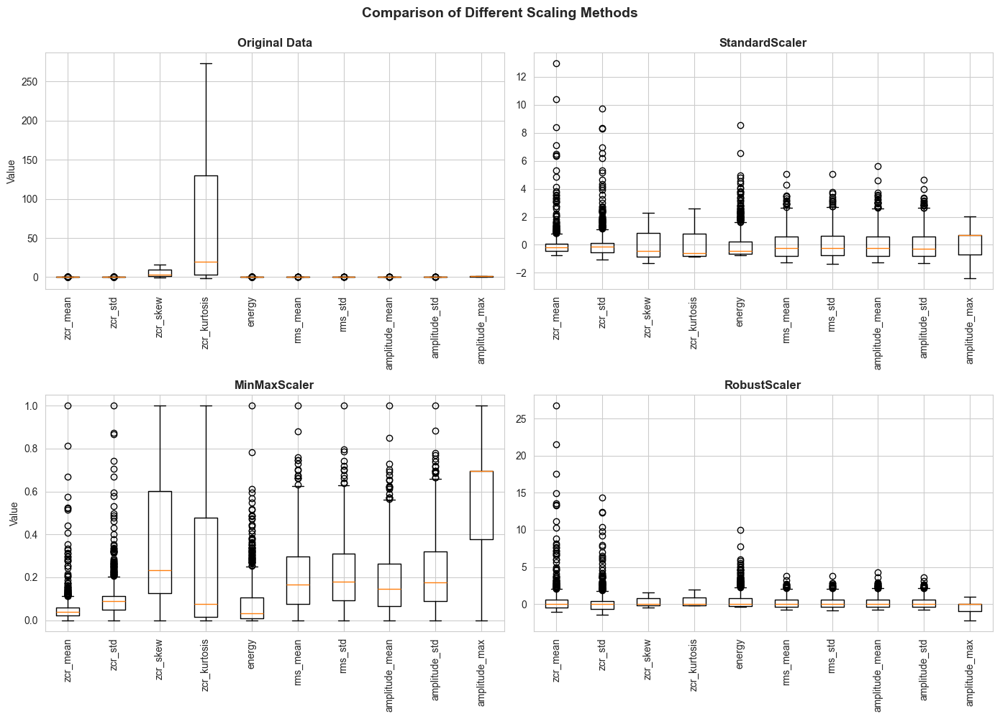

In [60]:
# Visualize scaling effects
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Original
axes[0, 0].boxplot([X_raw[col] for col in X_raw.columns[:10]], 
                    labels=X_raw.columns[:10])
axes[0, 0].set_title('Original Data', fontweight='bold')
axes[0, 0].tick_params(axis='x', rotation=90)
axes[0, 0].set_ylabel('Value')

# StandardScaler
axes[0, 1].boxplot([scaled_data['StandardScaler'][:, i] for i in range(10)],
                    labels=X_raw.columns[:10])
axes[0, 1].set_title('StandardScaler', fontweight='bold')
axes[0, 1].tick_params(axis='x', rotation=90)

# MinMaxScaler
axes[1, 0].boxplot([scaled_data['MinMaxScaler'][:, i] for i in range(10)],
                    labels=X_raw.columns[:10])
axes[1, 0].set_title('MinMaxScaler', fontweight='bold')
axes[1, 0].tick_params(axis='x', rotation=90)
axes[1, 0].set_ylabel('Value')

# RobustScaler
axes[1, 1].boxplot([scaled_data['RobustScaler'][:, i] for i in range(10)],
                    labels=X_raw.columns[:10])
axes[1, 1].set_title('RobustScaler', fontweight='bold')
axes[1, 1].tick_params(axis='x', rotation=90)

plt.suptitle('Comparison of Different Scaling Methods', 
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('10_scaling_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

In [61]:
# Use StandardScaler for further analysis
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_raw)
X = pd.DataFrame(X_scaled, columns=X_raw.columns)

**STATISTICAL ANALYSIS (MANOVA)**

In [62]:
selected_features_for_manova = ['zcr_mean', 'spectral_centroid_mean', 
                                'spectral_rolloff_mean', 'spectral_bandwidth_mean',
                                'mfcc_0_mean', 'mfcc_1_mean', 'energy', 'rms_mean']

manova_data = features_df[selected_features_for_manova + ['label']].copy()

In [63]:
# Perform MANOVA
print("\nPerforming MANOVA test...")
print(f"Testing {len(selected_features_for_manova)} features across 4 classes")

formula = ' + '.join(selected_features_for_manova) + ' ~ label'
manova = MANOVA.from_formula(formula, data=manova_data)
manova_results = manova.mv_test()


Performing MANOVA test...
Testing 8 features across 4 classes


In [64]:
print("\nMANOVA Results:")
print(manova_results)


MANOVA Results:
                   Multivariate linear model
                                                                
----------------------------------------------------------------
       Intercept         Value  Num DF  Den DF   F Value  Pr > F
----------------------------------------------------------------
          Wilks' lambda  0.0183 8.0000 909.0000 6099.6705 0.0000
         Pillai's trace  0.9817 8.0000 909.0000 6099.6705 0.0000
 Hotelling-Lawley trace 53.6825 8.0000 909.0000 6099.6705 0.0000
    Roy's greatest root 53.6825 8.0000 909.0000 6099.6705 0.0000
----------------------------------------------------------------
                                                                
----------------------------------------------------------------
          label          Value   Num DF   Den DF  F Value Pr > F
----------------------------------------------------------------
           Wilks' lambda 0.8832 24.0000 2636.9778  4.8089 0.0000
          Pillai's trace 0.1

In [66]:
from scipy.stats import f_oneway

In [68]:
# Univariate ANOVA for each feature
print("UNIVARIATE ANOVA (Feature-wise significance)")
anova_results = []

for feature in X_raw.columns:
    groups = [features_df[features_df['label'] == label][feature].values 
              for label in features_df['label'].unique()]
    f_stat, p_value = f_oneway(*groups)
    anova_results.append({
        'Feature': feature,
        'F-statistic': f_stat,
        'P-value': p_value,
        'Significant': p_value < 0.05
    })

anova_df = pd.DataFrame(anova_results)
anova_df = anova_df.sort_values('P-value')

UNIVARIATE ANOVA (Feature-wise significance)


In [69]:
print(f"\nTop 20 most significant features:")
print(anova_df.head(20).to_string(index=False))


Top 20 most significant features:
                 Feature F-statistic P-value Significant
              chroma_std   33.259472     0.0        True
              mfcc_8_std   19.098537     0.0        True
             mfcc_13_std   17.802074     0.0        True
             mfcc_14_std    17.17655     0.0        True
              mfcc_9_std   16.804632     0.0        True
             chroma_mean   16.776976     0.0        True
             mfcc_15_std   16.057034     0.0        True
spectral_contrast_3_mean   16.030342     0.0        True
             mfcc_10_std   15.611797     0.0        True
             mfcc_11_std   15.587168     0.0        True
              mfcc_5_std   15.568096     0.0        True
              mfcc_2_std   15.535083     0.0        True
              mfcc_6_std   14.427761     0.0        True
              mfcc_0_std   14.062566     0.0        True
             mfcc_12_std   13.846261     0.0        True
 spectral_bandwidth_mean    13.80669     0.0        T

In [73]:
alpha = 0.05  

significant_features = anova_df.loc[anova_df['P-value'] < alpha, 'Feature'].tolist()
print(f"\n{len(significant_features)}/{len(X_raw.columns)} features are statistically significant")



75/116 features are statistically significant


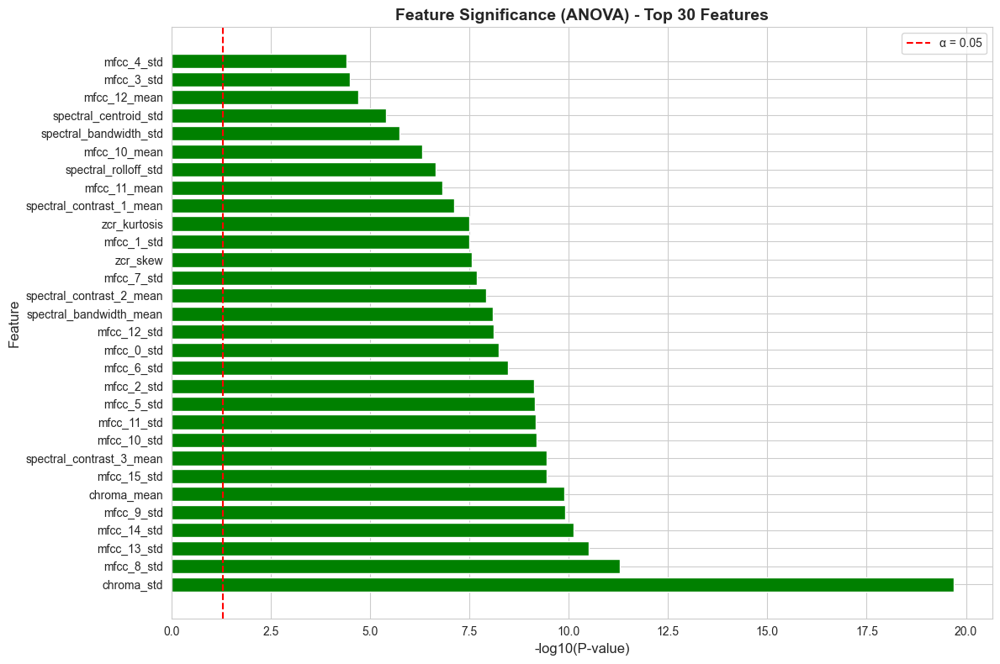

In [75]:
# Ensure P-values are real floats
anova_df['P-value'] = anova_df['P-value'].apply(lambda x: float(np.squeeze(x)))

top30 = anova_df.head(30).copy()
pvals = top30['P-value'].astype(float).to_numpy()

fig, ax = plt.subplots(figsize=(12, 8))

colors = ['green' if x else 'gray' for x in top30['Significant']]

ax.barh(top30['Feature'], -np.log10(pvals), color=colors)
ax.axvline(x=-np.log10(0.05), color='red', linestyle='--', label='α = 0.05')
ax.set_xlabel('-log10(P-value)', fontsize=12)
ax.set_ylabel('Feature', fontsize=12)
ax.set_title('Feature Significance (ANOVA) - Top 30 Features',
             fontsize=14, fontweight='bold')
ax.legend()
plt.tight_layout()
plt.savefig('11_anova_results.png', dpi=300, bbox_inches='tight')
plt.show()


**CORRELATION ANALYSIS**

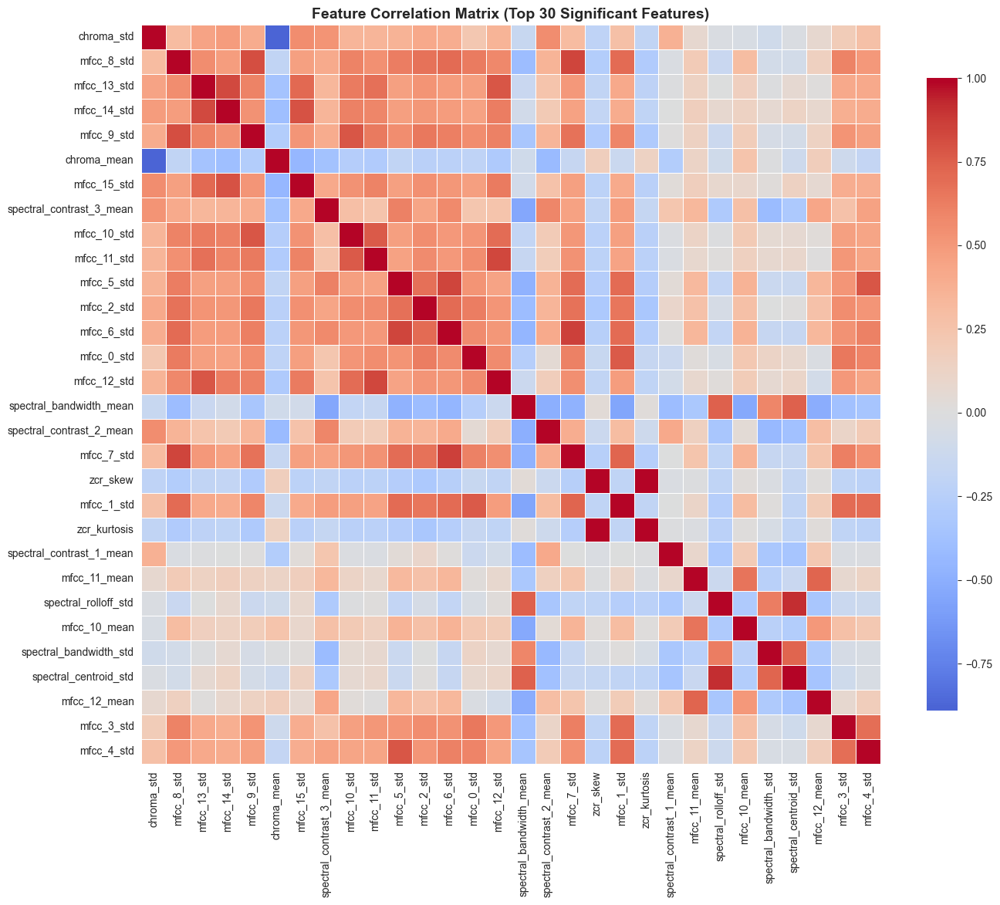

In [76]:
# Compute correlation matrix
correlation_matrix = X_raw[significant_features[:30]].corr()

# Visualize correlation matrix
plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', center=0,
            square=True, linewidths=0.5, cbar_kws={"shrink": 0.8})
plt.title('Feature Correlation Matrix (Top 30 Significant Features)', 
          fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('12_correlation_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# Find highly correlated features
high_corr_threshold = 0.8
high_corr_pairs = []

for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) > high_corr_threshold:
            high_corr_pairs.append({
                'Feature 1': correlation_matrix.columns[i],
                'Feature 2': correlation_matrix.columns[j],
                'Correlation': correlation_matrix.iloc[i, j]
            })

if high_corr_pairs:
    print(f"\nHighly correlated feature pairs (|r| > {high_corr_threshold}):")
    print(pd.DataFrame(high_corr_pairs).to_string(index=False))
else:
    print(f"\nNo highly correlated pairs found with |r| > {high_corr_threshold}")


Highly correlated feature pairs (|r| > 0.8):
           Feature 1             Feature 2  Correlation
          chroma_std           chroma_mean    -0.890235
          mfcc_8_std            mfcc_9_std     0.808133
          mfcc_8_std            mfcc_7_std     0.839543
         mfcc_13_std           mfcc_14_std     0.822989
         mfcc_11_std           mfcc_12_std     0.837360
          mfcc_5_std            mfcc_6_std     0.842739
          mfcc_6_std            mfcc_7_std     0.863031
            zcr_skew          zcr_kurtosis     0.991859
spectral_rolloff_std spectral_centroid_std     0.916994


**FEATURE SELECTION**

In [78]:
# Encode labels
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_encoded = le.fit_transform(y)

print(f"Class mapping: {dict(zip(le.classes_, le.transform(le.classes_)))}")

Class mapping: {'Both': np.int64(0), 'Crackles': np.int64(1), 'Normal': np.int64(2), 'Wheezes': np.int64(3)}


1. UNIVARIATE FEATURE SELECTION

In [79]:
print("\n1. UNIVARIATE FEATURE SELECTION (SelectKBest):")

# ANOVA F-test
selector_anova = SelectKBest(f_classif, k=50)
X_selected_anova = selector_anova.fit_transform(X, y_encoded)

# Get selected feature names
selected_features_anova = X.columns[selector_anova.get_support()].tolist()
print(f"   Selected {len(selected_features_anova)} features using ANOVA F-test")

# Mutual Information
selector_mi = SelectKBest(mutual_info_classif, k=50)
X_selected_mi = selector_mi.fit_transform(X, y_encoded)

selected_features_mi = X.columns[selector_mi.get_support()].tolist()
print(f"   Selected {len(selected_features_mi)} features using Mutual Information")


1. UNIVARIATE FEATURE SELECTION (SelectKBest):
   Selected 50 features using ANOVA F-test
   Selected 50 features using Mutual Information


2. RECURSIVE FEATURE ELIMINATION (RFE)

In [80]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
rfe = RFE(estimator=rf_model, n_features_to_select=50, step=10)
rfe.fit(X, y_encoded)

selected_features_rfe = X.columns[rfe.get_support()].tolist()
print(f"   Selected {len(selected_features_rfe)} features using RFE")

   Selected 50 features using RFE


3. FEATURE IMPORTANCE (Random Forest)

In [81]:
rf_model.fit(X, y_encoded)
feature_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf_model.feature_importances_
}).sort_values('Importance', ascending=False)

print("\nTop 20 most important features:")
print(feature_importances.head(20).to_string(index=False))


Top 20 most important features:
                 Feature  Importance
              chroma_std    0.016300
             chroma_mean    0.012997
              mfcc_7_std    0.012933
             mfcc_10_std    0.011384
spectral_contrast_2_mean    0.011370
         mfcc_1_kurtosis    0.011173
spectral_contrast_1_mean    0.011021
         mfcc_7_kurtosis    0.010933
             mfcc_14_std    0.010928
             tonnetz_std    0.010770
            mfcc_10_mean    0.010587
             mfcc_11_std    0.010533
         percussive_mean    0.010486
              mfcc_0_std    0.010325
             mfcc_2_skew    0.010241
            mfcc_14_skew    0.010223
            mfcc_11_mean    0.010202
  spectral_bandwidth_std    0.010167
             mfcc_0_mean    0.010058
spectral_contrast_0_mean    0.010016


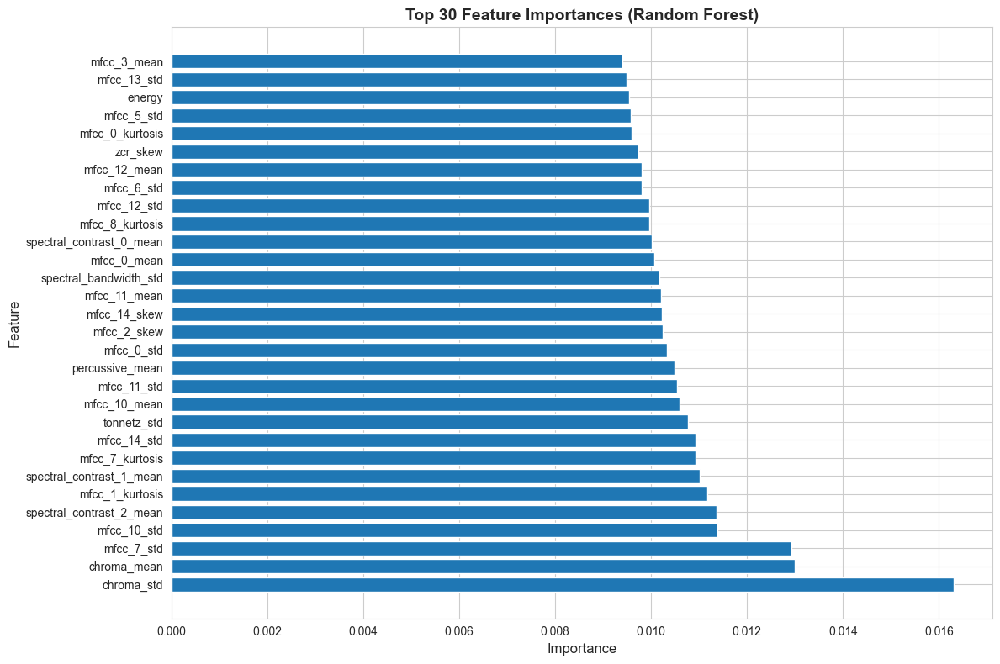

In [82]:
# Visualize feature importance
plt.figure(figsize=(12, 8))
plt.barh(feature_importances.head(30)['Feature'], 
         feature_importances.head(30)['Importance'])
plt.xlabel('Importance', fontsize=12)
plt.ylabel('Feature', fontsize=12)
plt.title('Top 30 Feature Importances (Random Forest)', 
          fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('13_feature_importance.png', dpi=300, bbox_inches='tight')
plt.show()

**FINAL FEATURE SET**

In [85]:
# Get top features from RF importance
top_rf_features = feature_importances.head(50)['Feature'].tolist()

# Find intersection of different methods
final_features = list(set(selected_features_anova) & 
                     set(selected_features_mi) & 
                     set(selected_features_rfe) & 
                     set(top_rf_features))

print(f"\nFeatures selected by all methods: {len(final_features)}")


Features selected by all methods: 18


In [ ]:
# # If intersection is too small, use union of top features
# if len(final_features) < 30:
#     print(f"Intersection too small, using top 40 features from RF importance")
#     final_features = top_rf_features[:40]

# print(f"\n✓ Final feature set contains {len(final_features)} features")
# print(f"\nFinal features:")
# for i, feat in enumerate(final_features[:20], 1):
#     print(f"  {i}. {feat}")
# if len(final_features) > 20:
#     print(f"  ... and {len(final_features) - 20} more")


Intersection too small, using top 40 features from RF importance

✓ Final feature set contains 40 features

Final features:
  1. chroma_std
  2. chroma_mean
  3. mfcc_7_std
  4. mfcc_10_std
  5. spectral_contrast_2_mean
  6. mfcc_1_kurtosis
  7. spectral_contrast_1_mean
  8. mfcc_7_kurtosis
  9. mfcc_14_std
  10. tonnetz_std
  11. mfcc_10_mean
  12. mfcc_11_std
  13. percussive_mean
  14. mfcc_0_std
  15. mfcc_2_skew
  16. mfcc_14_skew
  17. mfcc_11_mean
  18. spectral_bandwidth_std
  19. mfcc_0_mean
  20. spectral_contrast_0_mean
  ... and 20 more


In [86]:
# Create final feature matrix
X_final = X[final_features]

print(f"\nFinal feature matrix shape: {X_final.shape}")


Final feature matrix shape: (920, 18)


In [87]:
# Save selected features
selected_features_df = pd.DataFrame({
    'feature': final_features,
    'importance': [feature_importances[feature_importances['Feature'] == f]['Importance'].values[0] 
                   for f in final_features]
}).sort_values('importance', ascending=False)

selected_features_df.to_csv('selected_features.csv', index=False)
print("Selected features saved to 'selected_features.csv'")

Selected features saved to 'selected_features.csv'


**MEL SPECTROGRAM GENERATION**

In [94]:
import os

AUDIO_DIR = r"C:\Users\hp\Desktop\Biomed\Respiratory_Sound_Database\audio_and_txt_files"


# Add full paths
features_df['audio_path'] = features_df['filename'].apply(
    lambda fn: os.path.join(AUDIO_DIR, fn + ".wav")
)

# Check existence
features_df['file_exists'] = features_df['audio_path'].apply(os.path.exists)

print("\nFile existence summary:")
print(features_df['file_exists'].value_counts())

# Show missing
missing_files = features_df[~features_df['file_exists']]
if len(missing_files) > 0:
    print("\nMissing files:")
    print(missing_files[['filename', 'audio_path']])



File existence summary:
file_exists
True    920
Name: count, dtype: int64


In [95]:
def generate_mel_spectrogram(audio_path, sr=22050, n_mels=128, fmax=8000,
                             target_length=128):
    """
    Generate mel spectrogram from audio file
    
    Parameters:
    -----------
    audio_path : str
        Path to audio file
    sr : int
        Sample rate
    n_mels : int
        Number of mel bands
    fmax : int
        Maximum frequency
    target_length : int
        Target width (time steps) for the spectrogram
    
    Returns:
    --------
    mel_spec : numpy array
        Mel spectrogram of shape (n_mels, target_length, 1)
    """
    try:
        # Load audio
        y, sr = librosa.load(audio_path, sr=sr)
        
        # Trim silence
        y, _ = librosa.effects.trim(y, top_db=20)
        
        # Generate mel spectrogram
        mel_spec = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=n_mels, 
                                                   fmax=fmax)
        
        # Convert to dB scale
        mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
        
        # Normalize to [0, 1]
        mel_spec_norm = (mel_spec_db - mel_spec_db.min()) / (mel_spec_db.max() - mel_spec_db.min())
        
        # Resize to target length
        if mel_spec_norm.shape[1] < target_length:
            # Pad with zeros if too short
            pad_width = target_length - mel_spec_norm.shape[1]
            mel_spec_norm = np.pad(mel_spec_norm, ((0, 0), (0, pad_width)), 
                                   mode='constant')
        else:
            # Truncate if too long
            mel_spec_norm = mel_spec_norm[:, :target_length]
        
        # Add channel dimension
        mel_spec_norm = mel_spec_norm[:, :, np.newaxis]
        
        return mel_spec_norm
    
    except Exception as e:
        print(f"Error generating mel spectrogram for {audio_path}: {str(e)}")
        return None

In [96]:
# Generate mel spectrograms for all files
mel_specs = []
labels = []
patient_ids = []

for idx, row in features_df.iterrows():
    if idx % 100 == 0:
        print(f"Processing {idx+1}/{len(features_df)}")
    
    mel_spec = generate_mel_spectrogram(row['audio_path'])
    
    if mel_spec is not None:
        mel_specs.append(mel_spec)
        labels.append(row['label'])
        patient_ids.append(row['patient_id'])

Processing 1/920
Processing 101/920
Processing 201/920
Processing 301/920
Processing 401/920
Processing 501/920
Processing 601/920
Processing 701/920
Processing 801/920
Processing 901/920


In [97]:
# Convert to numpy arrays
X_mel = np.array(mel_specs)
y_mel = np.array(labels)
patient_ids_array = np.array(patient_ids)

In [99]:
print(f"Shape of mel spectrogram array: {X_mel.shape}")
print(f"  (samples, mel_bands, time_steps, channels)")

Shape of mel spectrogram array: (920, 128, 128, 1)
  (samples, mel_bands, time_steps, channels)


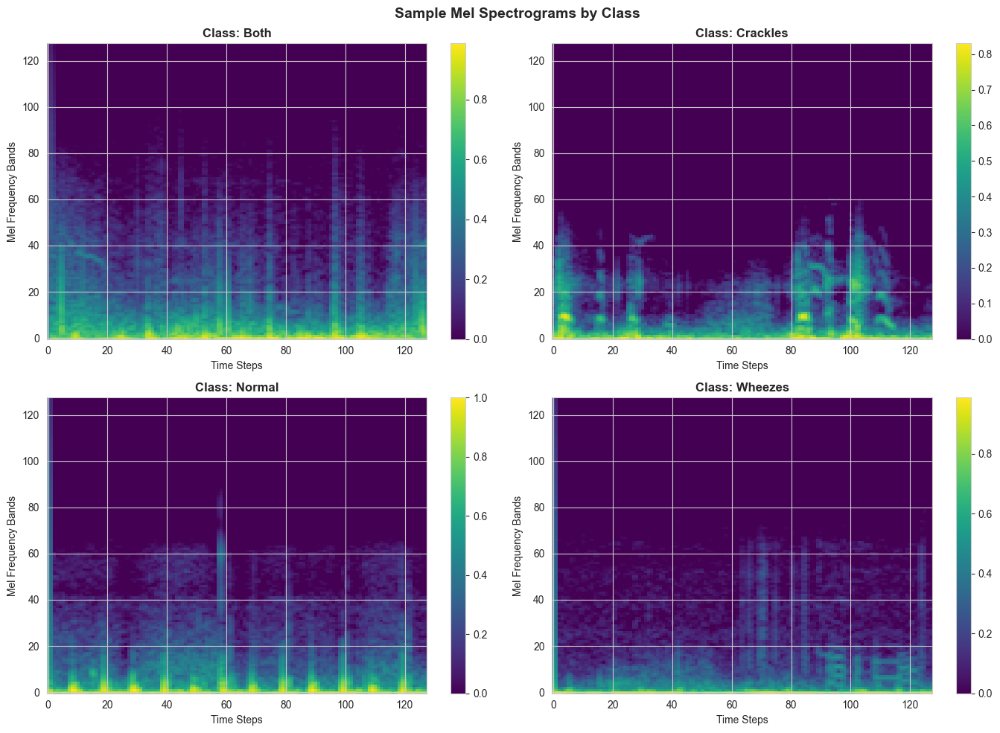

In [100]:
# Visualize sample mel spectrograms from each class
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.ravel()

for idx, label in enumerate(le.classes_):
    # Get first sample of this class
    class_idx = np.where(y_mel == label)[0][0]
    mel_spec = X_mel[class_idx][:, :, 0]  # Remove channel dimension for plotting
    
    im = axes[idx].imshow(mel_spec, aspect='auto', origin='lower', cmap='viridis')
    axes[idx].set_title(f'Class: {label}', fontsize=12, fontweight='bold')
    axes[idx].set_xlabel('Time Steps')
    axes[idx].set_ylabel('Mel Frequency Bands')
    plt.colorbar(im, ax=axes[idx])

plt.suptitle('Sample Mel Spectrograms by Class', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('14_mel_spectrograms_by_class.png', dpi=300, bbox_inches='tight')
plt.show()

**SUBJECT-WISE TRAIN-TEST SPLIT**

In [102]:
# Stratified split by patient (ensure each patient is in only train or test)
from sklearn.model_selection import StratifiedShuffleSplit

In [101]:
# Get unique patients
unique_patients = np.unique(patient_ids_array)
print(f"\nTotal unique patients: {len(unique_patients)}")


Total unique patients: 126


In [103]:
# Get patient-level labels (majority vote)
patient_labels = {}
for patient in unique_patients:
    patient_recordings = y_mel[patient_ids_array == patient]
    # Use majority class for this patient
    unique, counts = np.unique(patient_recordings, return_counts=True)
    patient_labels[patient] = unique[np.argmax(counts)]

patients = np.array(list(patient_labels.keys()))
patient_label_array = np.array([patient_labels[p] for p in patients])


In [104]:
# Split patients
patient_splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_patient_idx, test_patient_idx = next(patient_splitter.split(patients, patient_label_array))

train_patients = patients[train_patient_idx]
test_patients = patients[test_patient_idx]

In [106]:
print(f"Training patients: {len(train_patients)}")
print(f"Testing patients: {len(test_patients)}")

Training patients: 100
Testing patients: 26


In [107]:
# Split data based on patient IDs
train_mask = np.isin(patient_ids_array, train_patients)
test_mask = np.isin(patient_ids_array, test_patients)

In [108]:
X_train_mel = X_mel[train_mask]
X_test_mel = X_mel[test_mask]
y_train_mel = y_mel[train_mask]
y_test_mel = y_mel[test_mask]

In [109]:
print(f"\nTraining samples: {len(X_train_mel)}")
print(f"Testing samples: {len(X_test_mel)}")


Training samples: 706
Testing samples: 214


In [110]:
# Encode labels
y_train_encoded = le.transform(y_train_mel)
y_test_encoded = le.transform(y_test_mel)

In [111]:
# Convert to categorical
y_train_cat = to_categorical(y_train_encoded, num_classes=len(le.classes_))
y_test_cat = to_categorical(y_test_encoded, num_classes=len(le.classes_))

In [112]:
# Check class distribution
print("\nClass distribution in training set:")
print(pd.Series(y_train_mel).value_counts())
print("\nClass distribution in test set:")
print(pd.Series(y_test_mel).value_counts())


Class distribution in training set:
Crackles    228
Normal      202
Both        164
Wheezes     112
Name: count, dtype: int64

Class distribution in test set:
Normal      85
Crackles    69
Both        38
Wheezes     22
Name: count, dtype: int64


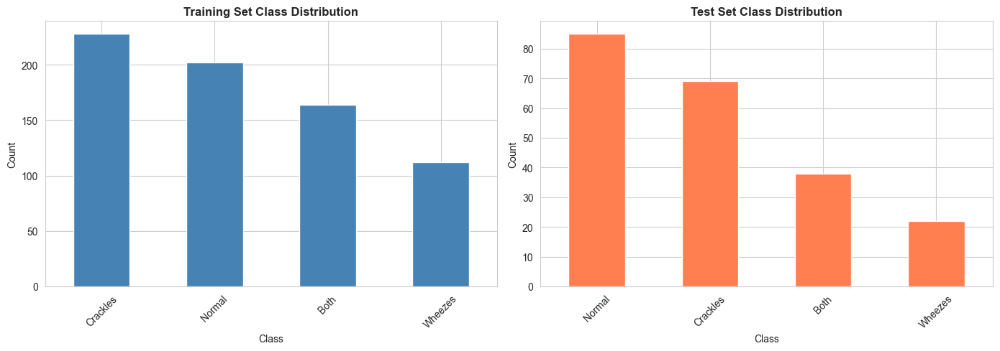

In [114]:
# Visualize split
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Training set
pd.Series(y_train_mel).value_counts().plot(kind='bar', ax=axes[0], color='steelblue')
axes[0].set_title('Training Set Class Distribution', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Class')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=45)

# Test set
pd.Series(y_test_mel).value_counts().plot(kind='bar', ax=axes[1], color='coral')
axes[1].set_title('Test Set Class Distribution', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Class')
axes[1].set_ylabel('Count')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig('15_train_test_split.png', dpi=300, bbox_inches='tight')
plt.show()

**CNN MODEL BUILDING**

In [126]:
import numpy as np
import pandas as pd

# 1) How many classes?
print("Classes from label encoder:", le.classes_)
print("num_classes:", num_classes)

# 2) Label distribution
unique, counts = np.unique(y_train_cat.argmax(axis=1), return_counts=True)
print("\nTrain class distribution (one-hot indices):")
print(dict(zip(unique, counts)))

# 3) Check that X and y align
print("\nX_train_mel shape:", X_train_mel.shape)
print("y_train_cat shape:", y_train_cat.shape)


Classes from label encoder: ['Both' 'Crackles' 'Normal' 'Wheezes']
num_classes: 4

Train class distribution (one-hot indices):
{np.int64(0): np.int64(164), np.int64(1): np.int64(228), np.int64(2): np.int64(202), np.int64(3): np.int64(112)}

X_train_mel shape: (706, 128, 128, 1)
y_train_cat shape: (706, 4)


In [137]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier

rf_clf = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestClassifier(
        n_estimators=300,
        max_depth=None,
        min_samples_split=5,
        min_samples_leaf=2,
        class_weight='balanced',   # important
        random_state=42,
        n_jobs=-1
    ))
])

print("\nTraining Random Forest (Normal vs Abnormal)...")
rf_clf.fit(X_train_bin, y_train_bin)



Training Random Forest (Normal vs Abnormal)...


,steps,"[('scaler', ...), ('rf', ...)]"
,transform_input,None
,memory,None
,verbose,False
,copy,True
,with_mean,True
,with_std,True
,n_estimators,300
,criterion,'gini'
,max_depth,None
,min_samples_split,5


In [138]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

y_pred_bin = rf_clf.predict(X_test_bin)

acc_bin = accuracy_score(y_test_bin, y_pred_bin)
print("\n" + "="*60)
print("BINARY CLASSIFICATION: NORMAL vs ABNORMAL")
print("="*60)
print(f"✓ Test Accuracy: {acc_bin:.4f}")

print("\nClassification report:")
print(classification_report(y_test_bin, y_pred_bin, target_names=['Normal', 'Abnormal']))

print("\nConfusion matrix (rows = true, cols = predicted):")
print(confusion_matrix(y_test_bin, y_pred_bin))



BINARY CLASSIFICATION: NORMAL vs ABNORMAL
✓ Test Accuracy: 0.7065

Classification report:
              precision    recall  f1-score   support

      Normal       0.56      0.25      0.34        57
    Abnormal       0.73      0.91      0.81       127

    accuracy                           0.71       184
   macro avg       0.64      0.58      0.58       184
weighted avg       0.68      0.71      0.67       184


Confusion matrix (rows = true, cols = predicted):
[[ 14  43]
 [ 11 116]]
